<a href="https://colab.research.google.com/github/RafiShiddik/Project/blob/main/Project_data_clinic_pada_data_set_california_di_kaggle_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split

# Scalling untuk MinMax Scaller
from sklearn.preprocessing import MinMaxScaler
# Set the maximum number of columns and rows to display to a large number
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
df = pd.read_csv('/content/drive/MyDrive/california_dataset.csv')

In [3]:
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,house_price
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [4]:
df.tail()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,house_price
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847
20639,2.3886,16.0,5.254717,1.162264,1387.0,2.616981,39.37,-121.24,0.894


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MedInc       20640 non-null  float64
 1   HouseAge     20640 non-null  float64
 2   AveRooms     20640 non-null  float64
 3   AveBedrms    20640 non-null  float64
 4   Population   20640 non-null  float64
 5   AveOccup     20640 non-null  float64
 6   Latitude     20640 non-null  float64
 7   Longitude    20640 non-null  float64
 8   house_price  20640 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB


In [48]:
df.shape

(19959, 9)

Kolom	Penjelasan Singkat

MedInc	Median income di area tersebut

HouseAge	Umur bangunan

AveRooms	Rata-rata jumlah kamar per rumah

AveBedrms	Rata-rata jumlah kamar tidur per rumah

Population	Jumlah populasi area

AveOccup	Rata-rata penghuni per rumah

Latitude	Koordinat latitude

Longitude	Koordinat longitude

house_price	Target — harga rumah

In [6]:
df.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,house_price
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704,2.068558
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532,1.153956
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000,1.196000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000,1.797000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000,2.647250
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000,5.000010


#For EDA

##Mengecek duplikat data

In [7]:
df.duplicated().sum()

np.int64(0)

##mengecek mising value

In [8]:
df.isnull().sum()

,0
MedInc,0
HouseAge,0
AveRooms,0
AveBedrms,0
Population,0
AveOccup,0
Latitude,0
Longitude,0
house_price,0


In [9]:
df.value_counts()

MedInc   HouseAge  AveRooms    AveBedrms  Population  AveOccup     Latitude  Longitude  house_price
15.0001  47.0      8.592308    1.061538   749.0       2.880769     34.13     -118.10    5.00001        1
         46.0      9.203947    0.973684   410.0       2.697368     34.08     -118.42    5.00001        1
                   8.365591    0.967742   238.0       2.559140     34.08     -118.43    5.00001        1
                   6.000000    0.800000   13.0        2.600000     37.50     -122.14    5.00001        1
         45.0      10.370656   1.092664   857.0       3.308880     34.09     -118.40    5.00001        1
         43.0      5.687500    0.750000   58.0        3.625000     37.46     -121.87    5.00001        1
         42.0      9.229032    1.161290   829.0       2.674194     34.06     -118.49    5.00001        1
                   8.562500    0.964286   632.0       2.821429     34.05     -118.49    5.00001        1
         40.0      9.802326    1.135659   831.0       3.220930     37.46     -122.18    5.00001        1
                   9.600000    1.059459   1024.0      2.767568     34.09     -118.42    5.00001        1
                   8.584541    1.000000   577.0       2.787440     37.46     -122.21    5.00001        1
         38.0      8.954733    1.094650   798.0       3.283951     34.19     -118.20    5.00001        1
         37.0      9.333333    1.037801   809.0       2.780069     34.09     -118.41    5.00001        1
                   8.761062    1.000000   697.0       3.084071     34.15     -118.06    5.00001        1
                   8.659574    1.425532   100.0       2.127660     34.10     -118.37    5.00001        1
         36.0      9.368263    1.173653   862.0       2.580838     34.09     -118.44    5.00001        1
0.7054   43.0      2.229167    0.916667   107.0       2.229167     33.12     -117.08    1.37500        1
0.7025   19.0      2.425197    1.125984   1799.0      2.833071     35.30     -120.67    5.00001        1
0.7007   30.0      3.640000    1.024286   2086.0      2.980000     33.85     -118.18    1.34400        1
0.6991   26.0      2.669021    1.014127   1660.0      1.675076     36.72     -119.73    0.89500        1
0.6960   52.0      5.333333    1.592593   272.0       5.037037     37.95     -121.29    0.42500        1
0.6831   37.0      3.904832    0.982430   2865.0      4.194729     33.95     -118.23    0.87500        1
0.6825   17.0      2.372549    0.990196   198.0       0.970588     37.65     -121.00    1.87500        1
0.6775   52.0      1.748287    1.211215   2232.0      1.390654     34.05     -118.25    3.50000        1
0.6433   24.0      3.725664    0.893805   396.0       3.504425     32.71     -117.12    1.11300        1
0.5495   38.0      4.249057    1.018868   999.0       3.769811     33.96     -118.27    0.91700        1
0.5360   52.0      5.000000    1.000000   13.0        2.600000     32.75     -117.19    1.62500        1
         46.0      9.000000    1.500000   20.0        3.333333     34.16     -118.42    3.75000        1
                   3.142857    1.047619   37.0        1.761905     38.02     -121.84    0.87500        1
         36.0      12.250000   3.500000   18.0        2.250000     40.31     -123.17    0.14999        1
         33.0      4.928571    2.000000   47.0        3.357143     37.44     -121.31    1.12500        1
         26.0      7.846154    1.307692   43.0        3.307692     38.70     -122.52    0.87500        1
0.7685   39.0      2.752212    1.601770   206.0       1.823009     32.71     -117.17    1.87500        1
0.7684   31.0      2.569231    1.030769   780.0       6.000000     40.87     -124.07    1.53100        1
0.7683   38.0      4.253561    1.054131   1144.0      3.259259     37.76     -122.19    0.81800        1
0.7600   10.0      2.651515    1.054545   546.0       1.654545     37.81     -122.27    1.62500        1
0.7591   16.0      3.420000    1.084000   486.0       1.944000     33.74     -118.28    3.50000        1
0.7526   5.0   

In [10]:
# Menghitung median dari kolom 'medinc' di seluruh dataset
median_medinc = df['MedInc'].median()

# Mengisi nilai yang hilang dengan median pada kolom 'medinc'
df['MedInc'] = df['MedInc'].fillna(median_medinc)


In [11]:
# Menghitung median dari kolom 'medinc' di seluruh dataset
median_age = df['HouseAge'].median()

# Mengisi nilai yang hilang dengan median pada kolom 'medinc'
df['HouseAge'] = df['HouseAge'].fillna(median_medinc)

In [12]:
# Menghitung median dari kolom 'medinc' di seluruh dataset
median_age = df['AveRooms'].median()

# Mengisi nilai yang hilang dengan median pada kolom 'medinc'
df['AveRooms'] = df['AveRooms'].fillna(median_medinc)

In [13]:
# Menampilkan jumlah value counts dan isi value counts untuk semua kolom
for col in df.columns:
    value_counts = df[col].value_counts()
    print(f"=== {col} ===")
    print(f"Jumlah value counts: {len(value_counts)}")  # Jumlah value counts
    print(value_counts.head(50))  # Isi value counts
    print("-" * 50)

=== MedInc ===
Jumlah value counts: 12928
MedInc
15.0001    49
3.1250     49
2.8750     46
2.6250     44
4.1250     44
3.8750     41
3.0000     38
3.3750     38
3.6250     37
4.0000     37
4.3750     35
2.1250     33
2.3750     32
4.6250     31
3.5000     30
4.8750     29
2.2500     29
3.7500     29
3.2500     29
1.6250     29
4.2500     28
2.5000     28
3.6875     26
2.7500     25
4.5000     24
2.5625     21
1.8750     21
5.0000     20
3.0625     19
2.0000     18
3.3125     18
4.4375     18
5.5000     18
3.5625     17
3.0833     17
2.3333     16
3.3438     16
3.8125     16
4.0625     16
2.4375     16
4.0417     15
2.4167     15
3.1667     15
1.7500     15
3.5313     14
2.5833     14
3.6667     14
4.5625     14
3.9375     14
3.2813     14
Name: count, dtype: int64
--------------------------------------------------
=== HouseAge ===
Jumlah value counts: 52
HouseAge
52.0    1273
36.0     862
35.0     824
16.0     771
17.0     698
34.0     689
26.0     619
33.0     615
18.0     570
25.0   

In [14]:
df[['MedInc']].value_counts()

,count
MedInc,
3.1250,49
15.0001,49
2.8750,46
2.6250,44
4.1250,44
3.8750,41
3.0000,38
3.3750,38
4.0000,37


In [15]:
df[['HouseAge']].value_counts()

,count
HouseAge,
52.0,1273
36.0,862
35.0,824
16.0,771
17.0,698
34.0,689
26.0,619
33.0,615
18.0,570


In [16]:
df[['AveRooms']].value_counts()

,count
AveRooms,
5.000000,27
4.500000,22
4.000000,21
6.000000,20
5.333333,13
5.500000,11
4.666667,9
5.666667,8
3.000000,8


setelah tidak ada

##mengecek distribusi data

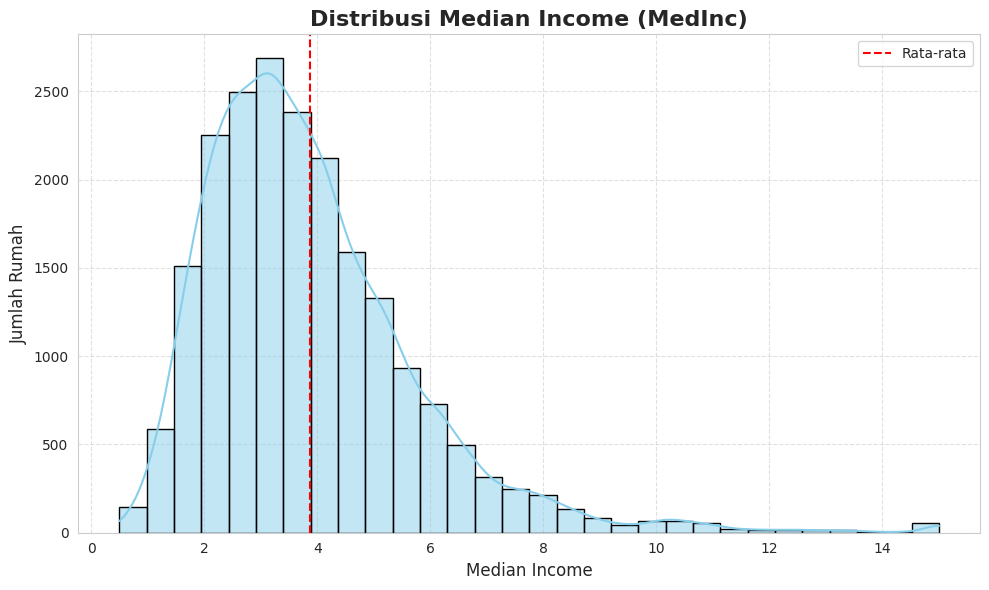

In [17]:
plt.figure(figsize=(10, 6))  # Ukuran besar, enak buat dilihat
sns.set_style("whitegrid")  # Gaya latar belakang yang bersih

# Plot histogram + garis KDE
sns.histplot(df['MedInc'], kde=True, color='skyblue', edgecolor='black', bins=30)

# Tambahkan judul dan label
plt.title('Distribusi Median Income (MedInc)', fontsize=16, fontweight='bold')
plt.xlabel('Median Income', fontsize=12)
plt.ylabel('Jumlah Rumah', fontsize=12)

# Tambahkan grid halus
plt.grid(True, linestyle='--', alpha=0.6)


plt.axvline(df['MedInc'].mean(), color='red', linestyle='--', label='Rata-rata')
plt.legend()

plt.tight_layout()
plt.show()

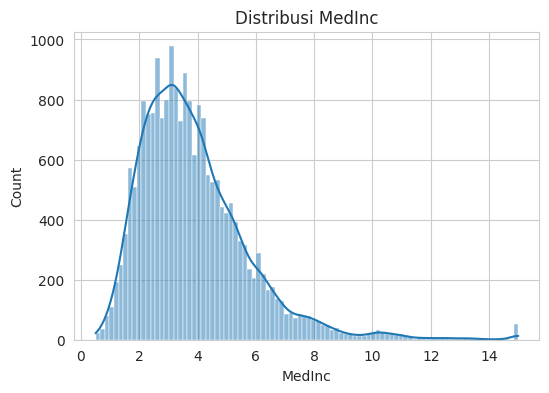

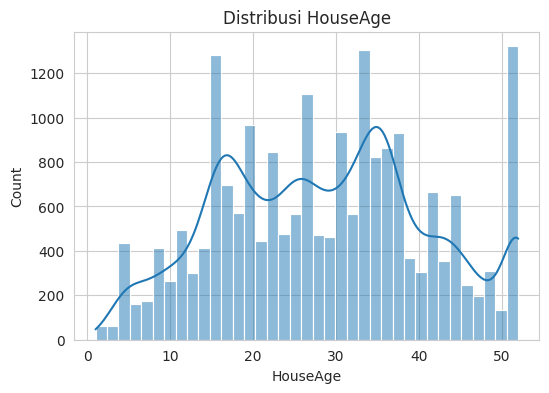

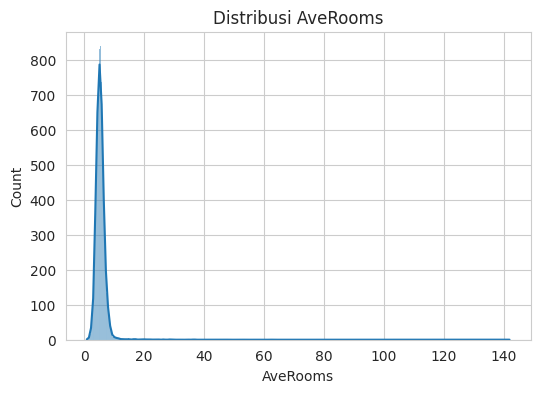

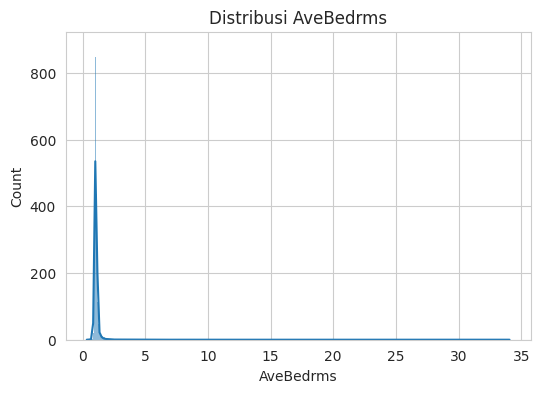

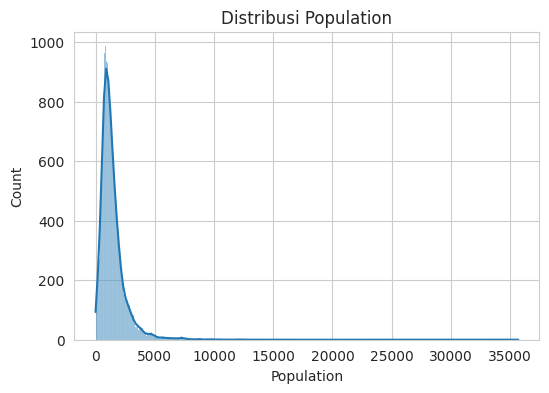

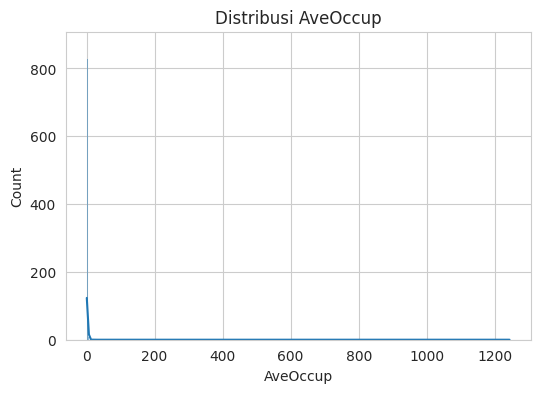

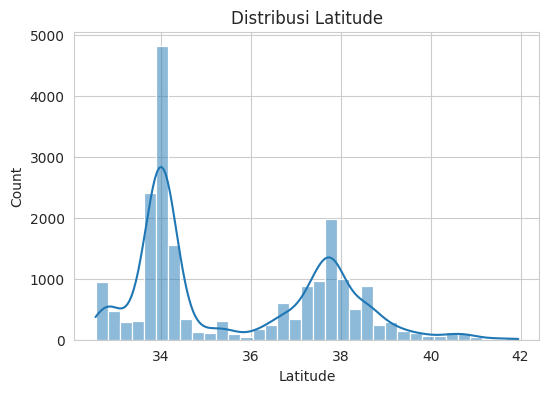

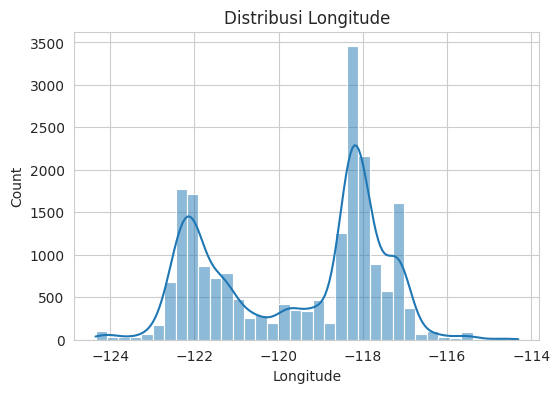

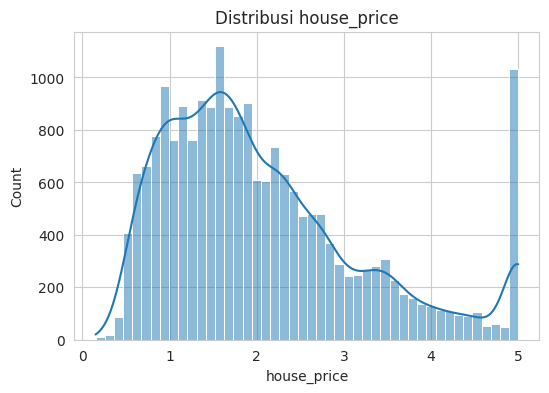

In [18]:
#mengecek distribusi data dari beberapa column numerik
import seaborn as sns

for col in df.select_dtypes(include='number').columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribusi {col}')
    plt.show()


##mengecek mising value pada EDA

In [19]:
df.isnull().sum()

,0
MedInc,0
HouseAge,0
AveRooms,0
AveBedrms,0
Population,0
AveOccup,0
Latitude,0
Longitude,0
house_price,0


##mengecek outliner pada data set

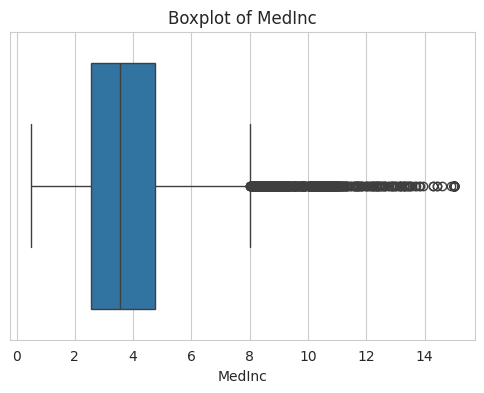

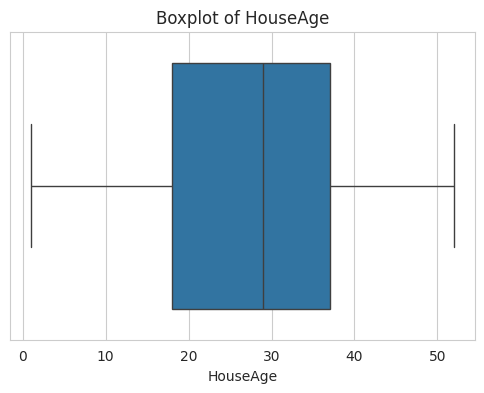

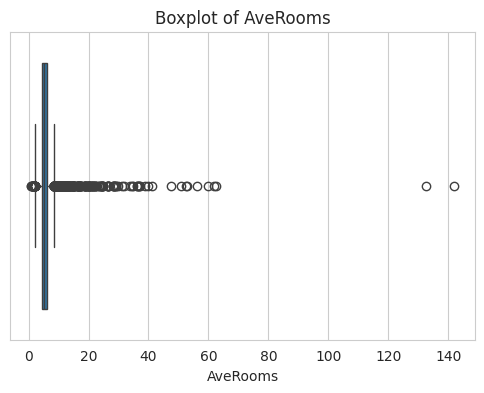

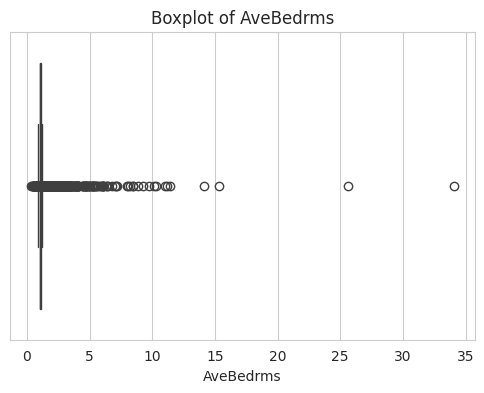

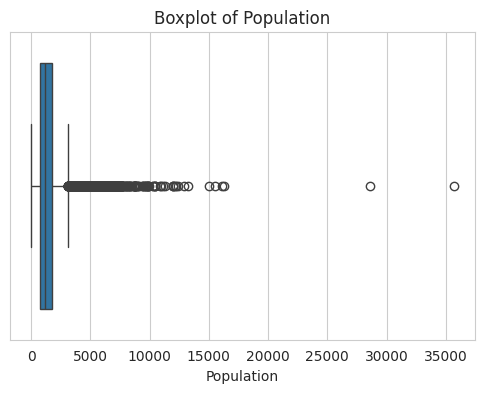

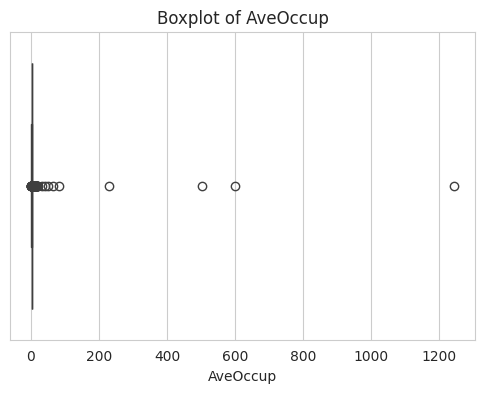

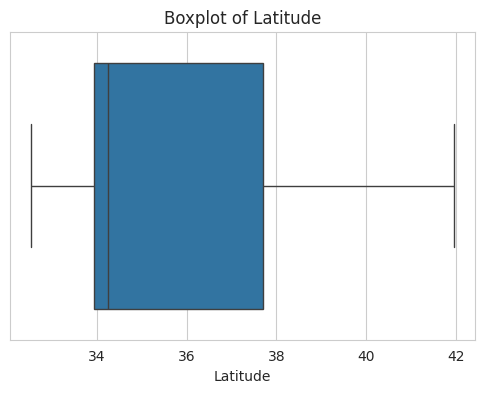

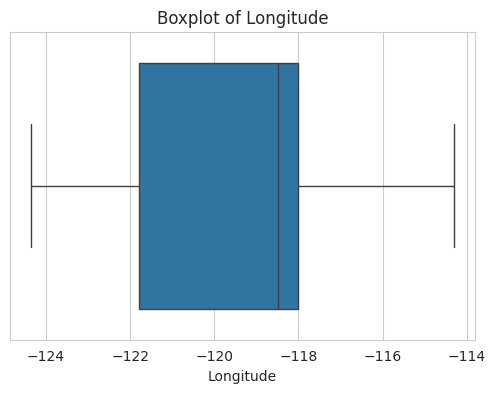

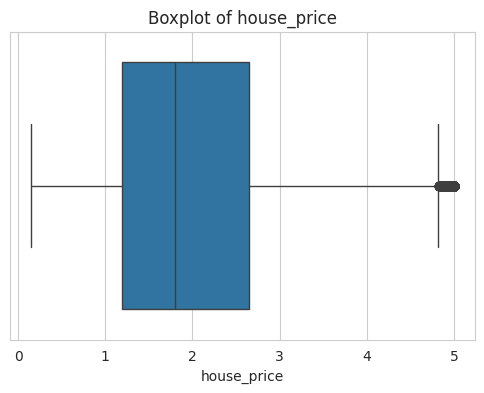

In [20]:
for col in df.select_dtypes(include='number').columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

##Heandling outliner pada EDA

In [21]:
# Menghitung IQR
q1 = df['MedInc'].quantile(0.25)
q3 = df['MedInc'].quantile(0.75)
iqr = q3 - q1
iqr

np.float64(2.17985)

In [22]:
# Menghitung Batas bawah dan batas atas
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
lower_bound, upper_bound

(np.float64(-0.7063750000000004), np.float64(8.013024999999999))

In [23]:
df = df[(df['MedInc'] >= lower_bound) & (df['MedInc'] <= upper_bound)]

<Axes: xlabel='MedInc'>

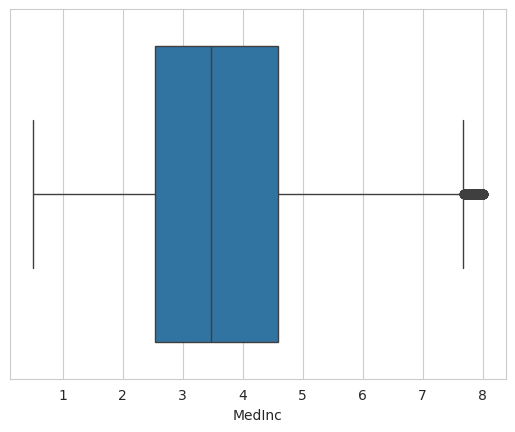

In [24]:
sns.boxplot(x=df['MedInc'])

In [25]:
#df copy untuk melihat apakah ini sudah di clean dengan benar shingga data aslinya tidak terganti jika ini eror
def remove_outliers_iqr(df):
    df_clean = df.copy()
    for col in df_clean.select_dtypes(include='number').columns:
        Q1 = df_clean[col].quantile(0.25)
        Q3 = df_clean[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        df_clean = df_clean[(df_clean[col] >= lower) & (df_clean[col] <= upper)]
    return df_clean

df_no_outliers = remove_outliers_iqr(df)




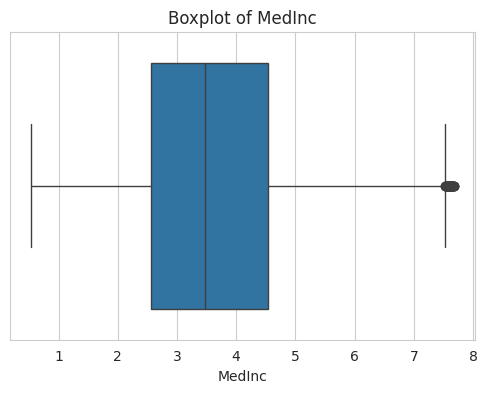

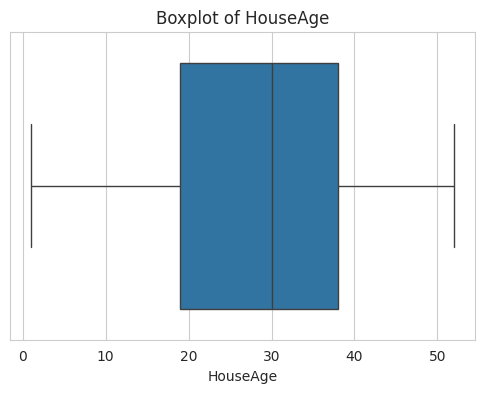

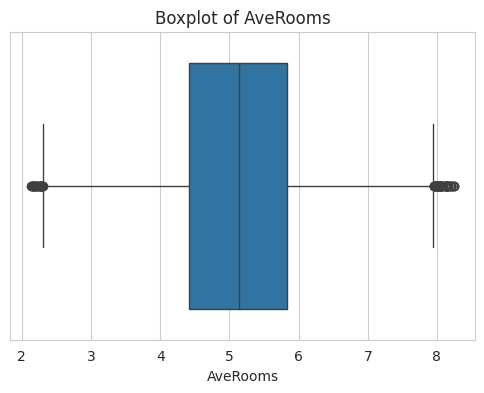

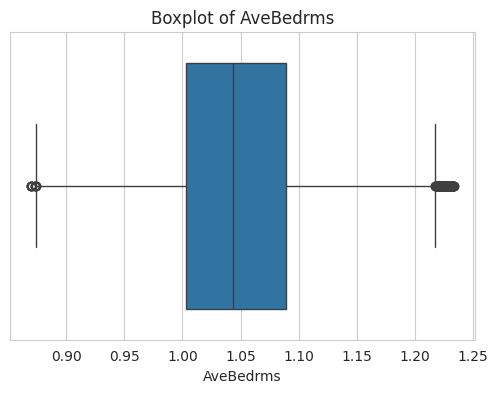

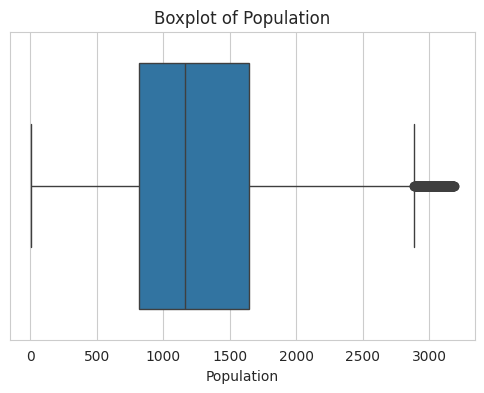

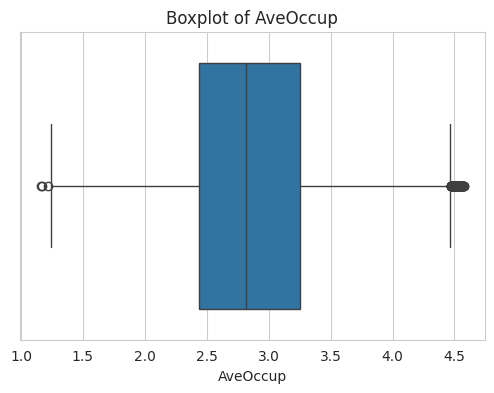

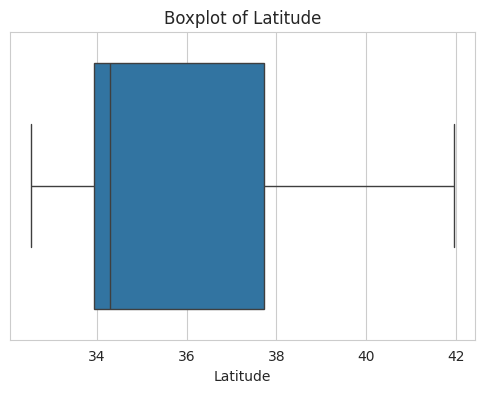

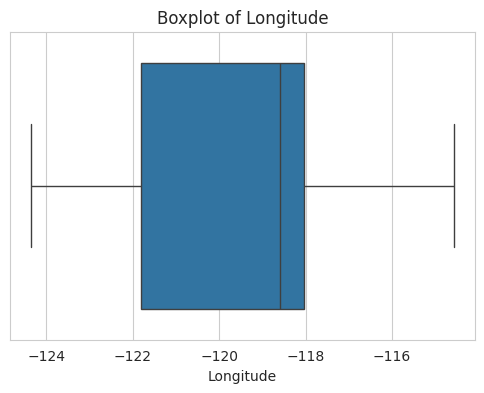

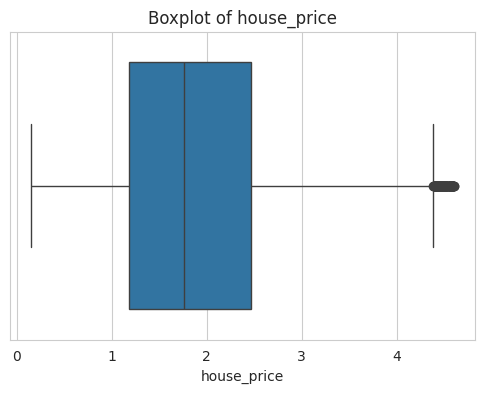

In [26]:
# Visualisasi boxplot semua kolom numerik tanpa outlier
for col in df_no_outliers.select_dtypes(include='number').columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=df_no_outliers[col].dropna())
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
    plt.show()


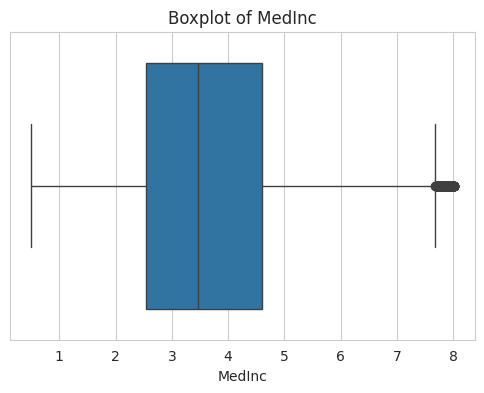

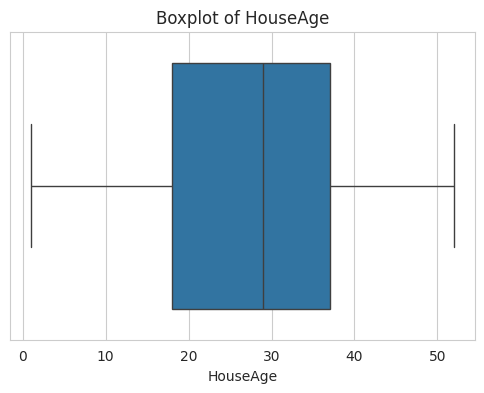

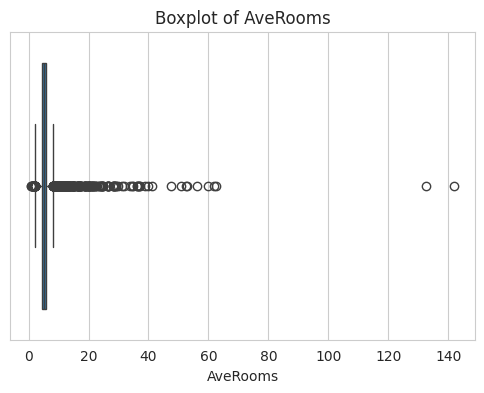

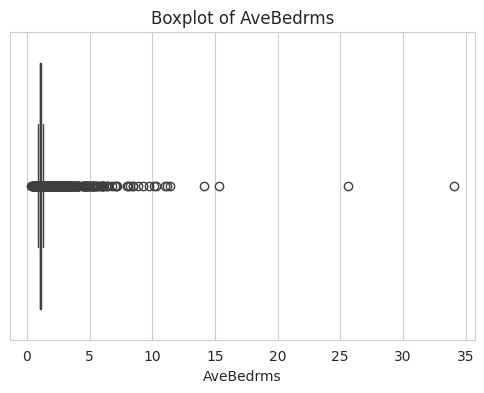

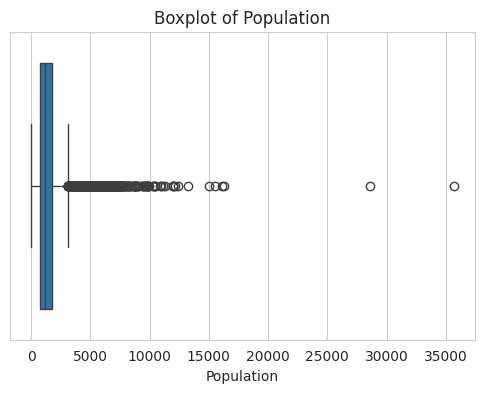

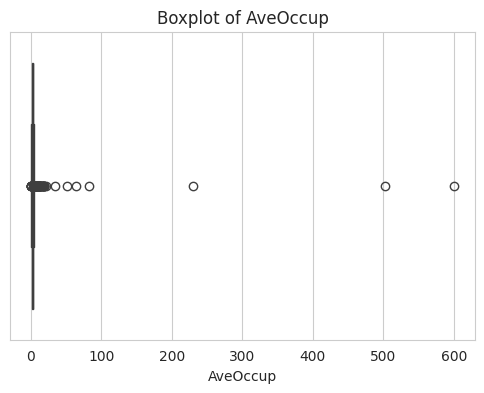

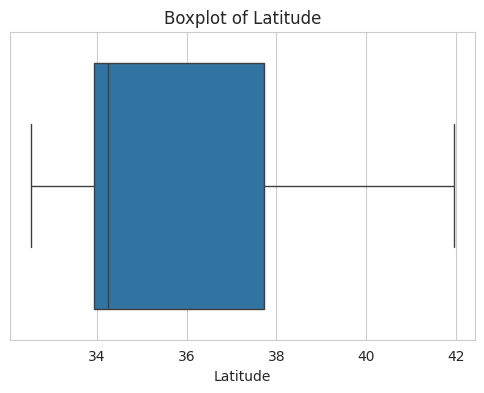

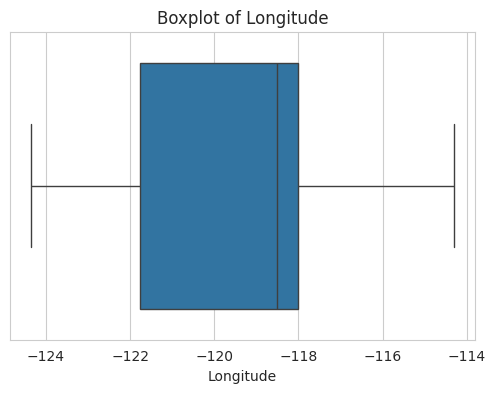

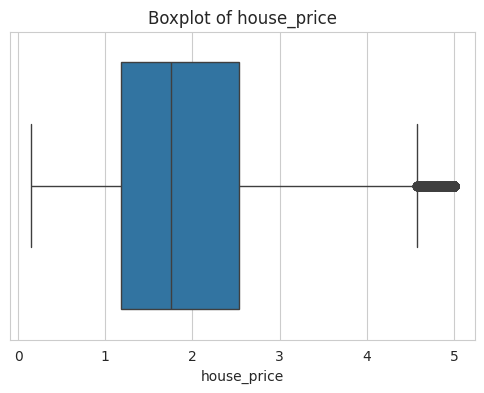

In [27]:
# Visualisasi boxplot semua kolom numerik tanpa outlier
for col in df.select_dtypes(include='number').columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=df[col].dropna())
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
    plt.show()

dari sini semua data sudah ditangani outliner nya

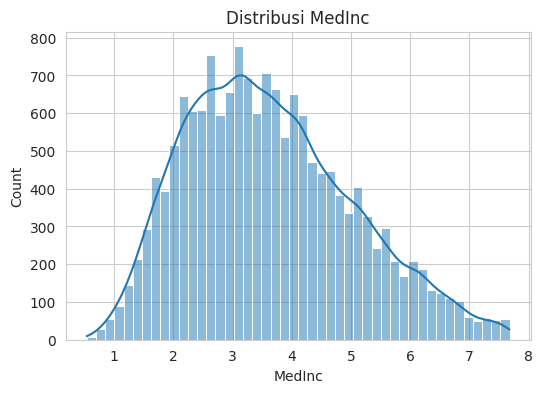

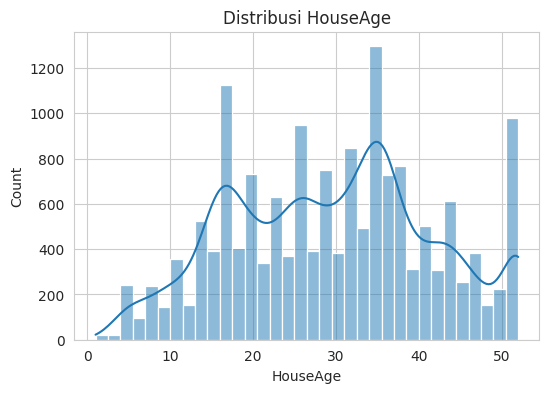

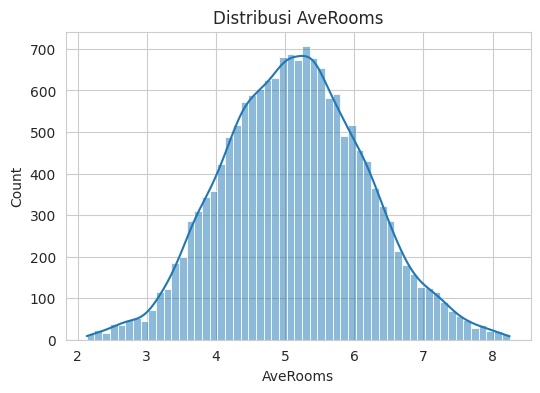

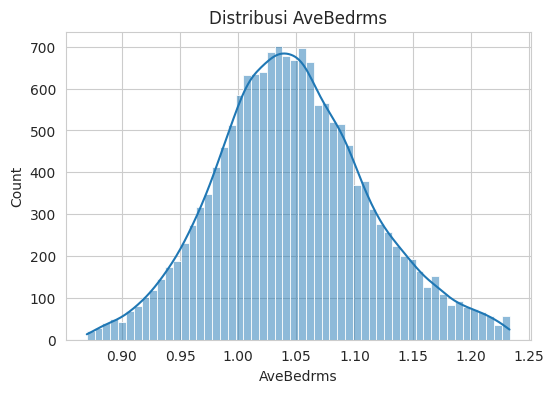

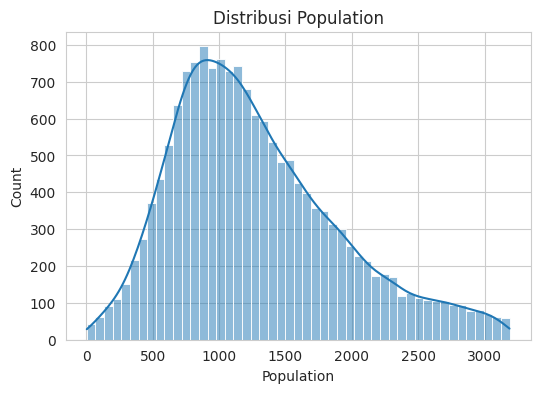

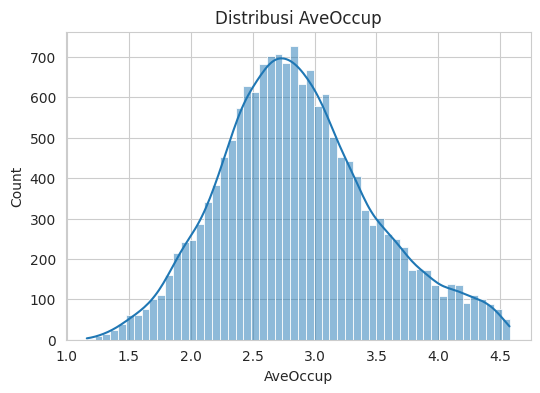

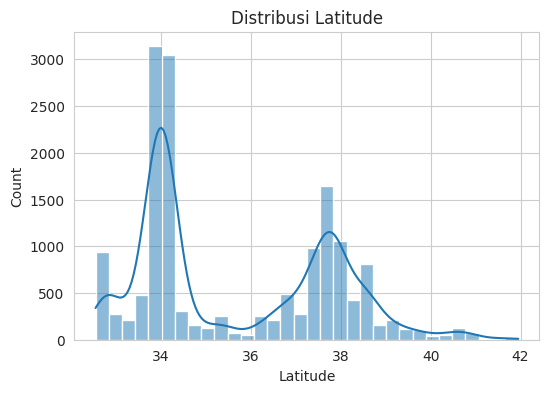

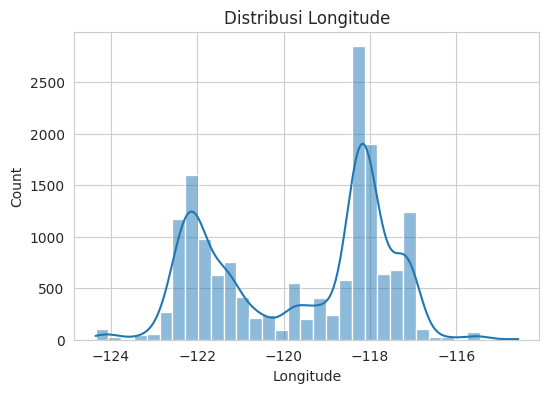

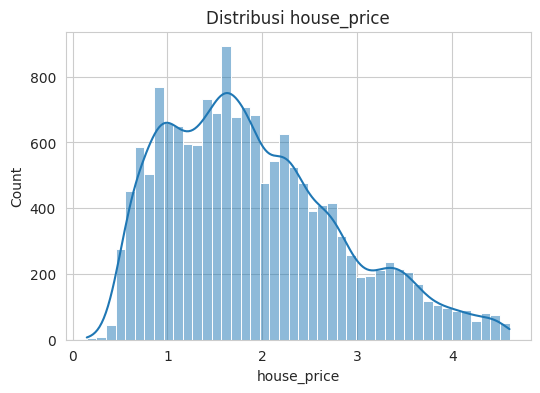

In [28]:
for col in df_no_outliers.select_dtypes(include='number').columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_no_outliers[col], kde=True)
    plt.title(f'Distribusi {col}')
    plt.show()

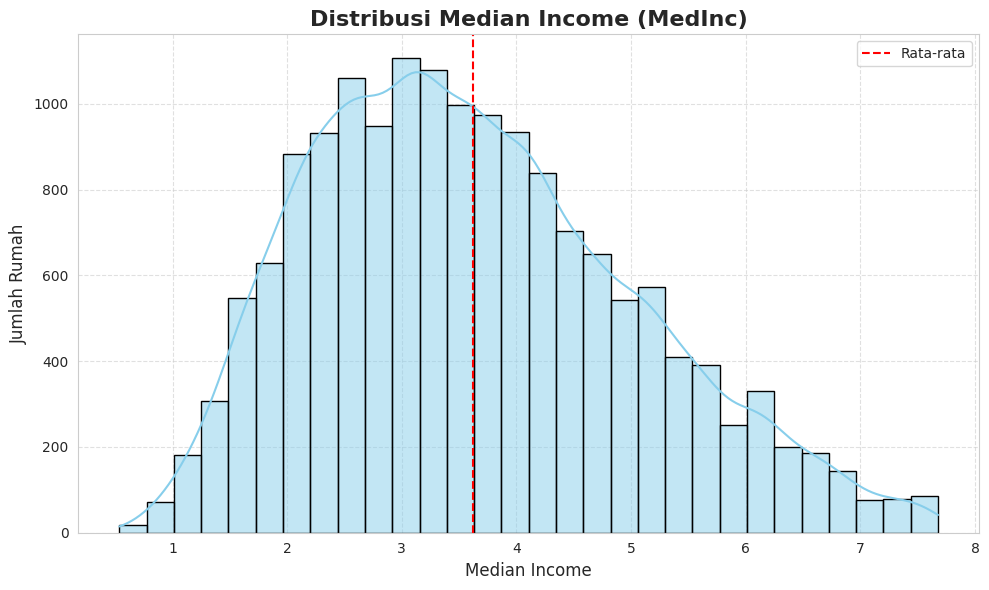

In [29]:
plt.figure(figsize=(10, 6))  # Ukuran besar, enak buat dilihat
sns.set_style("whitegrid")  # Gaya latar belakang yang bersih

# Plot histogram + garis KDE
sns.histplot(df_no_outliers['MedInc'], kde=True, color='skyblue', edgecolor='black', bins=30)

# Tambahkan judul dan label
plt.title('Distribusi Median Income (MedInc)', fontsize=16, fontweight='bold')
plt.xlabel('Median Income', fontsize=12)
plt.ylabel('Jumlah Rumah', fontsize=12)

# Tambahkan grid halus
plt.grid(True, linestyle='--', alpha=0.6)

# Optional: tambahkan garis rata-rata
plt.axvline(df_no_outliers['MedInc'].mean(), color='red', linestyle='--', label='Rata-rata')
plt.legend()

plt.tight_layout()
plt.show()

##korelasi antar variabel

In [30]:
# Melihat korelasi antar variabel numerik
correlation_matrix = df_no_outliers.corr(numeric_only=True)  # df adalah nama DataFrame kamu
print(correlation_matrix)

               MedInc  HouseAge  AveRooms  AveBedrms  Population  AveOccup  \
MedInc       1.000000 -0.177819  0.691594  -0.260227    0.001548 -0.033124   
HouseAge    -0.177819  1.000000 -0.204834  -0.072169   -0.277115  0.000017   
AveRooms     0.691594 -0.204834  1.000000  -0.002401   -0.068799  0.052302   
AveBedrms   -0.260227 -0.072169 -0.002401   1.000000    0.085228 -0.086744   
Population   0.001548 -0.277115 -0.068799   0.085228    1.000000  0.207593   
AveOccup    -0.033124  0.000017  0.052302  -0.086744    0.207593  1.000000   
Latitude    -0.076682  0.002850  0.139384   0.035837   -0.113248 -0.168322   
Longitude   -0.011779 -0.087303 -0.097375  -0.004984    0.105456  0.187316   
house_price  0.622656  0.090916  0.243541  -0.097153   -0.002329 -0.276247   

             Latitude  Longitude  house_price  
MedInc      -0.076682  -0.011779     0.622656  
HouseAge     0.002850  -0.087303     0.090916  
AveRooms     0.139384  -0.097375     0.243541  
AveBedrms    0.035837  -0.0

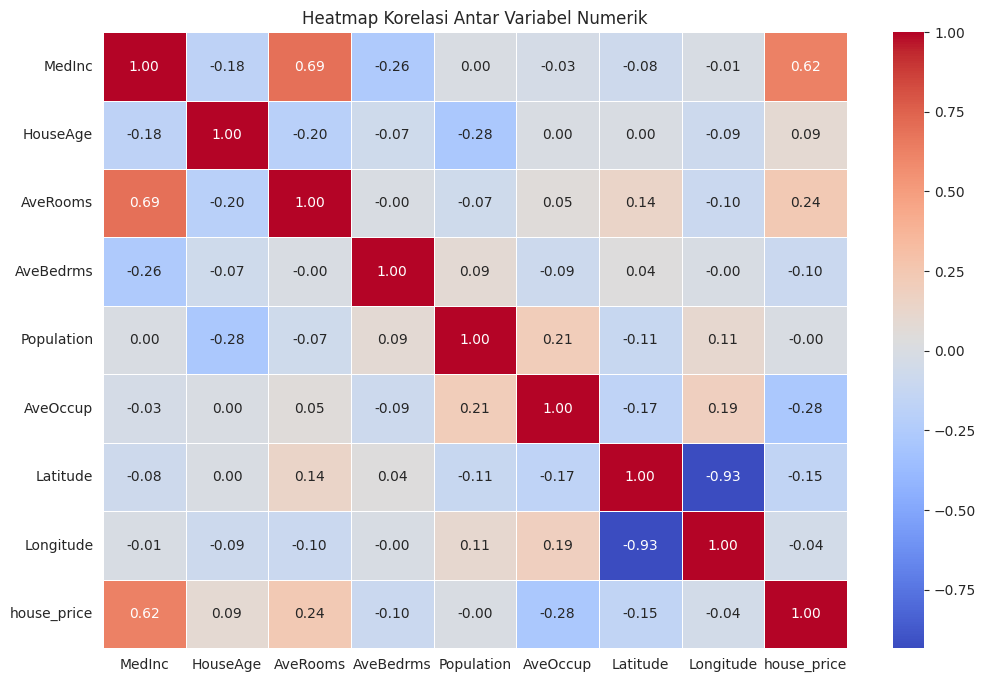

In [31]:
# Atur ukuran heatmap
plt.figure(figsize=(12, 8))

# Buat heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Judul heatmap
plt.title('Heatmap Korelasi Antar Variabel Numerik')
plt.show()

dari sini terlihat Averooms  memiliki korelasi positif paling kuat terhadap madeinc(median income suatu area),  selain averoms medinc(median income suatu area) memiliki korelasi positif paling kuat terhadap harga rumah, ini menunjukkan semakin tinggi pendapatan median suatu wilayah dan ketersediaan ruang maka akan semakin tinggi pula harga rumah di wilayah tersebut. Di sisi lain, fitur seperti AveBedrms dan Population menunjukkan korelasi yang sangat lemah, sehingga kemungkinan kontribusinya terhadap prediksi harga rumah tidak signifikan.

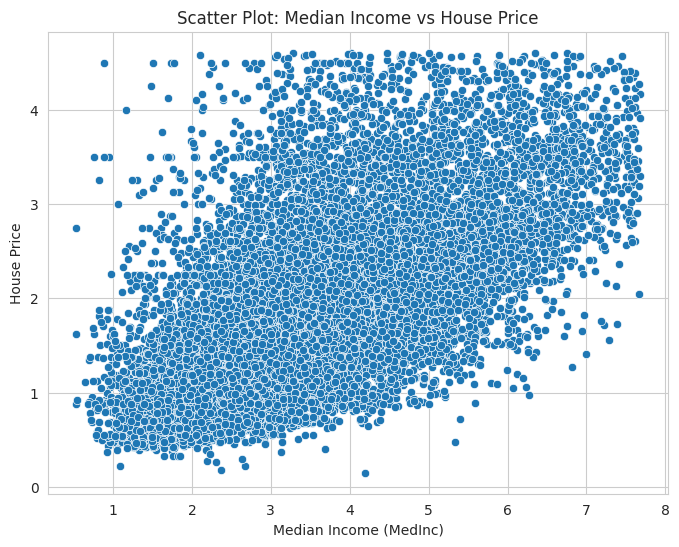

In [32]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_no_outliers, x='MedInc', y='house_price')
plt.title('Scatter Plot: Median Income vs House Price')
plt.xlabel('Median Income (MedInc)')
plt.ylabel('House Price')
plt.show()


In [33]:
df_no_outliers.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,house_price
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422
5,4.0368,52.0,4.761658,1.103627,413.0,2.139896,37.85,-122.25,2.697
6,3.6591,52.0,4.931907,0.951362,1094.0,2.128405,37.84,-122.25,2.992
7,3.1200,52.0,4.797527,1.061824,1157.0,1.788253,37.84,-122.25,2.414


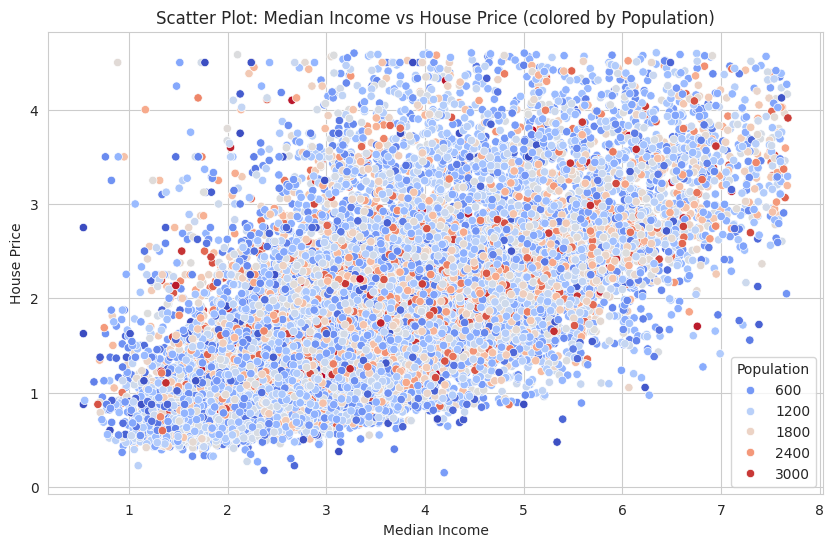

In [34]:
plt.figure(figsize=(10,6))
sns.scatterplot(data=df_no_outliers, x='MedInc', y='house_price', hue='Population', palette='coolwarm')
plt.title('Scatter Plot: Median Income vs House Price (colored by Population)')
plt.xlabel('Median Income')
plt.ylabel('House Price')
plt.legend(title='Population')
plt.show()


##hipotesis

HO = MedInc tidak mempengaruhi harga rumah

H1 = MedInc  mempengaruhi harga rumah

In [35]:
from scipy.stats import pearsonr

# Misal df adalah dataframe kamu
corr, p_value = pearsonr(df_no_outliers['MedInc'], df_no_outliers['house_price'])

print(f"Korelasi: {corr:.2f}")
print(f"P-Value: {p_value:.4f}")


Korelasi: 0.62
P-Value: 0.0000


In [36]:
# Keputusan
alpha = 0.05
if p_value <= alpha:
    print("Tolak H0")
else:
    print("Gagal menolak H0")

Tolak H0


Terdapat hubungan yang signifikan antara medinc dan house_price dan sangat kecil kemungkinannya terjadi dikarena kebetulan

In [37]:
from scipy.stats import pearsonr

# Misal df adalah dataframe kamu
corr, p_value = pearsonr(df_no_outliers['AveRooms'], df_no_outliers['house_price'])

print(f"Korelasi: {corr:.2f}")
print(f"P-Value: {p_value:.4f}")

Korelasi: 0.24
P-Value: 0.0000


In [38]:
# Keputusan
alpha = 0.05
if p_value <= alpha:
    print("Tolak H0")
else:
    print("Gagal menolak H0")

Tolak H0


Terdapat hubungan yang signifikan antara averooms dan house_price dan sangat kecil kemungkinannya terjadi karena kebetulan

#MECHINE LEARNING

In [39]:
from sklearn.model_selection import train_test_split

# Misal semua kolom kecuali house_price adalah fitur
X = df_no_outliers.drop("house_price", axis=1)  # Semua fitur (MedInc, HouseAge, dsb.)
y = df_no_outliers["house_price"]               # Target yang diprediksi

# Bagi data menjadi 80% train dan 20% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [40]:
# Gabungkan kembali fitur dan target untuk train dan test set
train_data = pd.concat([X_train, y_train], axis=1)
test_data = pd.concat([X_test, y_test], axis=1)

# Cek duplikat di train set
print("Duplikat di Train Set:")
print(train_data.duplicated().sum())  # Menampilkan jumlah duplikat

# Cek duplikat di test set
print("Duplikat di Test Set:")
print(test_data.duplicated().sum())  # Menampilkan jumlah duplikat



Duplikat di Train Set:
0
Duplikat di Test Set:
0


In [41]:
missing_percent = X_train.isnull().mean() * 100
print("Persentase missing values per kolom di X_train:")
print(missing_percent[missing_percent > 0])


Persentase missing values per kolom di X_train:
Series([], dtype: float64)


In [42]:
for col in X_train.columns:
    print(f"Kolom: {col}")
    print(X_train[col].value_counts(dropna=False))
    print("\n")


Streaming output truncated to the last 5000 lines.
1.897550     1
2.836257     1
2.392655     1
3.428235     1
3.028571     1
3.360877     1
3.250909     1
3.271248     1
3.803681     1
2.945017     1
2.400534     1
3.720524     1
2.924901     1
3.207792     1
2.940945     1
2.816456     1
3.826087     1
2.911162     1
1.429864     1
3.648712     1
2.186297     1
3.174721     1
1.765125     1
2.946633     1
2.874251     1
2.435730     1
2.707965     1
1.882353     1
2.905455     1
2.004815     1
3.202811     1
2.242120     1
2.357030     1
2.502347     1
1.964809     1
2.622746     1
2.862213     1
2.437788     1
2.931579     1
3.266979     1
3.304296     1
2.848780     1
2.586809     1
4.298429     1
2.654391     1
1.471963     1
3.120643     1
2.441905     1
2.975369     1
2.284047     1
2.975039     1
2.165666     1
2.571212     1
1.808036     1
3.558824     1
2.431818     1
2.248768     1
2.166932     1
2.676806     1
2.474240     1
2.988372     1
4.238095     1
2.116197     1
3.09

In [43]:
for col in X_train.columns:
    print(f"{col} - jumlah string kosong: {(X_train[col] == '').sum()}")
    print(f"{col} - jumlah spasi: {(X_train[col] == ' ').sum()}")


MedInc - jumlah string kosong: 0
MedInc - jumlah spasi: 0
HouseAge - jumlah string kosong: 0
HouseAge - jumlah spasi: 0
AveRooms - jumlah string kosong: 0
AveRooms - jumlah spasi: 0
AveBedrms - jumlah string kosong: 0
AveBedrms - jumlah spasi: 0
Population - jumlah string kosong: 0
Population - jumlah spasi: 0
AveOccup - jumlah string kosong: 0
AveOccup - jumlah spasi: 0
Latitude - jumlah string kosong: 0
Latitude - jumlah spasi: 0
Longitude - jumlah string kosong: 0
Longitude - jumlah spasi: 0


dari sini terlihat pada data traint test sudah tidak memiliki mising value sehingga bisa dilanjutkan tahapan selanjutnya

In [44]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)


In [45]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("MSE:", mse)
print("RMSE:", rmse)
print("R² Score:", r2)

MSE: 0.31689040497529825
RMSE: 0.5629301954730251
R² Score: 0.6299854443895231


dari sini mse digunakan untuk

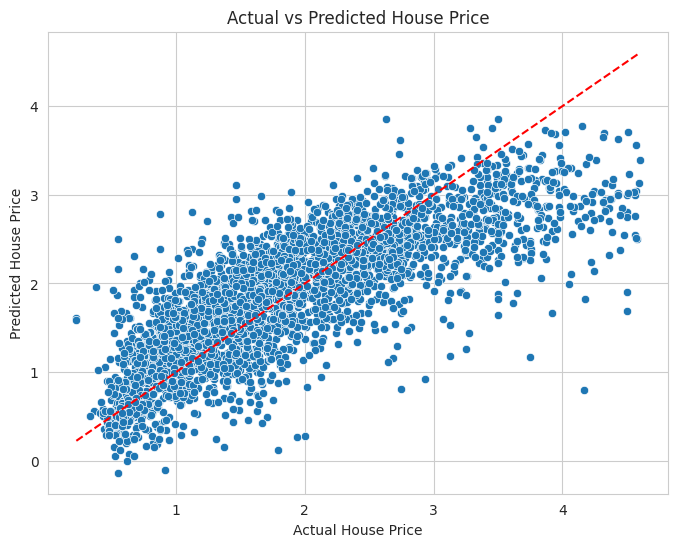

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(x=y_test, y=y_pred)
plt.xlabel("Actual House Price")
plt.ylabel("Predicted House Price")
plt.title("Actual vs Predicted House Price")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # garis lurus referensi
plt.show()


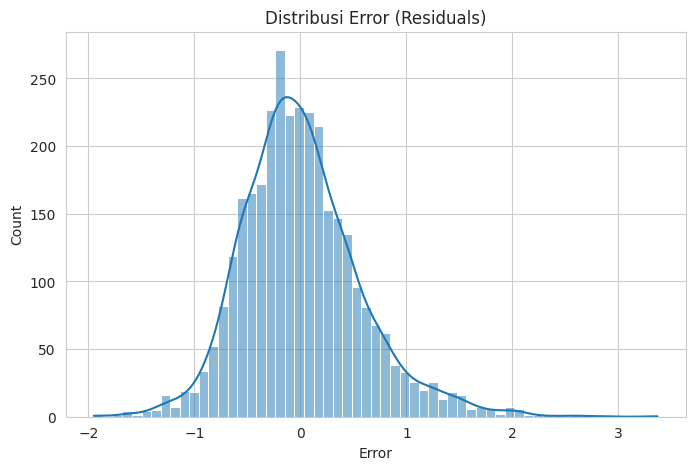

In [47]:
residuals = y_test - y_pred

plt.figure(figsize=(8,5))
sns.histplot(residuals, kde=True)
plt.title("Distribusi Error (Residuals)")
plt.xlabel("Error")
plt.show()
